In [1]:
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'


# Load the GeoPackage
fastfood = gpd.read_file("Data/fastfood_all_ohio.gpkg", layer="fastfood")

# Ensure correct CRS (Plotly requires WGS84)
if fastfood.crs is not None and fastfood.crs.to_epsg() != 4326:
    fastfood = fastfood.to_crs(epsg=4326)

# Extract latitude and longitude from geometry
fastfood["lat"] = fastfood.geometry.centroid.y
fastfood["lon"] = fastfood.geometry.centroid.x

# Interactive map
fig = px.scatter_mapbox(
    fastfood,
    lat="lat",
    lon="lon",
    hover_name="name",
    mapbox_style="carto-positron",
    zoom=6,
    title="Fast-Food Locations in Ohio (from GeoPackage)"
)
fig.show()

C:\Users\raab.75\AppData\Local\Temp\ipykernel_21424\2160165228.py:15: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_21424\2160165228.py:16: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [2]:
fastfood

,element,id,addr:city,addr:housenumber,addr:postcode,addr:state,addr:street,alt_name,amenity,brand,...,oneway,service,delivery:partner,internet_access:password,building:use,shop:historic,type,lat,lon,geometry
0,node,256553025,Loveland,10689,45140,OH,Loveland Madeira Road,None,fast_food,Tropical Smoothie Cafe,...,None,None,None,None,None,None,None,39.255059,-84.295558,POINT (-84.29556 39.25506)
1,node,256553326,Cincinnati,11902,45249,OH,Montgomery Road,None,fast_food,Papa John's,...,None,None,None,None,None,None,None,39.285234,-84.308865,POINT (-84.30886 39.28523)
2,node,256553679,None,None,None,None,None,None,fast_food,Domino's,...,None,None,None,None,None,None,None,39.287319,-84.307707,POINT (-84.30771 39.28732)
3,node,256555619,Mason,9540,45040,OH,Mason Montgomery Road,None,fast_food,Chipotle,...,None,None,None,None,None,None,None,39.299528,-84.314241,POINT (-84.31424 39.29953)
4,node,256658672,None,None,None,None,None,None,fast_food,Panera Bread,...,None,None,None,None,None,None,None,39.272762,-84.327882,POINT (-84.32788 39.27276)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6148,way,1441735049,Hillsboro,301,45133,OH,Chillicothe Avenue,Kentucky Fried Chicken,fast_food,KFC,...,None,None,None,None,None,None,None,39.202218,-83.598490,"POLYGON ((-83.59854 39.20213, -83.59857 39.202..."
6149,way,1442027576,Jackson,None,45640,OH,East Main Street,None,fast_food,Papa John's,...,None,None,None,None,None,None,None,39.031937,-82.625448,"POLYGON ((-82.62557 39.03194, -82.6255 39.0318..."
6150,way,1442159300,Middleburg Heights,18120,44130,OH,Bagley Road,None,fast_food,Raising Cane's,...,None,None,None,None,None,None,None,41.372460,-81.827688,"POLYGON ((-81.82775 41.3726, -81.82761 41.3726..."
6151,way,1442194424,Hillsboro,1279,45133,OH,North High Street,None,fast_food,Arby's,...,None,None,None,None,None,None,None,39.222725,-83.609522,"POLYGON ((-83.60937 39.22271, -83.60937 39.222..."


In [3]:
# now we load the big original data set and filter all of narratives that mention a fast-food branch

#lets search the narratives of ALL crashes for fast-food related keywords
import re 
import pandas as pd

df = pd.read_csv("Data/CrashStatistics.csv")

# Get unique names, removing duplicates
fastfood_names = fastfood["name"].dropna().unique()
fastfood_names_list = sorted(fastfood_names)
print(fastfood_names_list)

#to avoid apostrophes in fast food chain names
pattern = "|".join(re.escape(name).replace(r"\'", r"[’']?") for name in fastfood_names_list)

mask = df["Narrative"].str.contains(pattern, case=False, na=False)

# Subset DataFrame
narratives_fastfood = df[mask]

#narratives["mentions_fastfood"] = mask

# Preview
print(f"Number of narratives mentioning fast-food places: {len(narratives_fastfood)}")
print(narratives_fastfood.head(2))  

#indices_fastfood = narratives.index[mask]
#indices_near_fastfood = df.index[df["near_fastfood"] == True]

#overlap = indices_fastfood.intersection(indices_near_fastfood)
#print(f"Number of overlapping indices: {len(overlap)}")





C:\Users\raab.75\AppData\Local\Temp\ipykernel_21424\2914760601.py:7: DtypeWarning:

Columns (4,12,53,54,59,61) have mixed types. Specify dtype option on import or set low_memory=False.



['5 Points', 'A Matter of Steak', 'A Taste Above Restaurant', 'A Wok', 'A&W', 'A&W Root Beer', 'Absurd Bird', 'Acropolis Gyro Palace', 'Agape', 'Agave & Rye', 'Aglamesis Brothers', 'Agnes All Natural Grill', 'Al Dente', 'Al-Zaytuna Grill', 'All Fired Up', 'All India Cafe', 'All Star Philly Subs', "Altieri's Pizza", "Angelina's Pizza", 'Antojitos Salvadorenos', "Antonio's Pizza Express", "Antonio's Pizzeria", 'Apple Spice Junction', "Arby's", "Arthur Treacher's", "Arthur Treacher's Fish and Chips", 'Asian Too', 'Atrium Café', 'Atwood Dari Bar', 'Au Bon Pain', "Auntie Anne's", "Auntie Anne's and Cinnabon", "Auntie Annie's", 'B&K Root Beer', 'BIBIBOP Asian Grill', 'BackBeatQue', 'Bada-Bing', 'Bagel Boulevard', "Baker's", "Bambino's Pizza and Subs", 'BanaSun Smoothie Bar', "Banana's", 'Bareburger', 'Barry Bagels', "Barry's Bagels", 'Baskin Robins', 'Bayou Refreshments', 'Beach Food Concessions', 'Bee Kays Sweets', 'Beet Jar', "Bella's Pizza", 'Belleria PIzza', 'Bentino’s Pizza', 'Berry Ble

In [5]:
# Add new column 'mentions_fastfood'
df["mentions_fastfood"] = mask
# Extract the first fast-food chain mentioned
df["fastfood_chain"] = df["Narrative"].str.extract(f"({pattern})", flags=re.IGNORECASE)

In [ ]:

df.to_csv("Data/CrashStatistics_edited.csv", index=False)

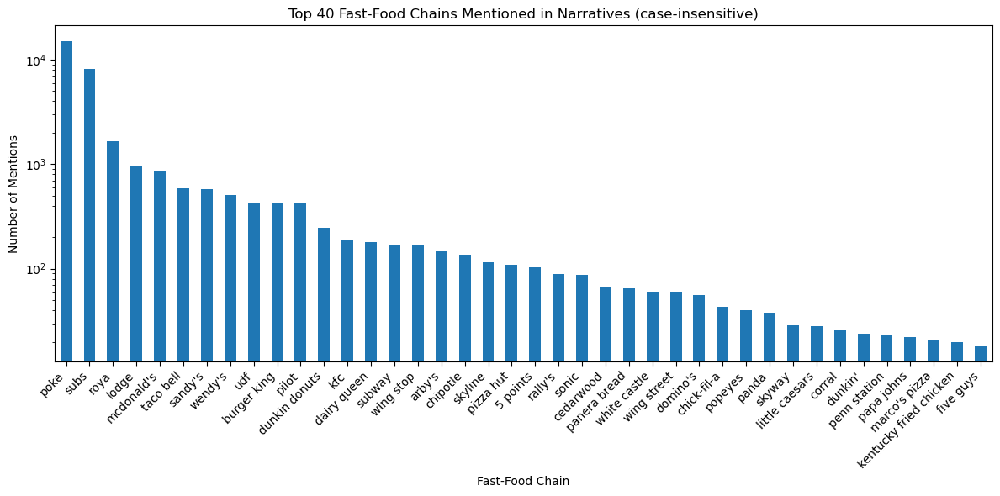

In [12]:
import matplotlib.pyplot as plt
# Count how often each chain is mentioned
# Count occurrences ignoring case
chain_counts = (
    df["fastfood_chain"]
    .dropna()
    .str.lower()
    .value_counts()
    .head(40)
)

# Plot
plt.figure(figsize=(12, 6))
chain_counts.plot(kind="bar")
plt.title("Top 40 Fast-Food Chains Mentioned in Narratives (case-insensitive)")
plt.ylabel("Number of Mentions")
plt.xlabel("Fast-Food Chain")
plt.xticks(rotation=45, ha="right")
plt.yscale('log')
plt.tight_layout()

In [6]:
df

,LocalReportNumber,DocumentNumber,CrashSeverity,HitSkip,LocalInformation,SecondaryCrash,PhotosTaken,OH2,OH3,OH1P,...,SmallTruckRelated,YouthRelated,TeenRelated,DUI21Related,SeniorRelated,FatalNotReportable,CommercialRelated,CommercialAtFault,mentions_fastfood,fastfood_chain
0,\t20183624,20202168971,Fatal,NaN,NaN,False,True,True,True,True,...,True,False,False,False,False,False,False,False,False,NaN
1,\t20179633,20202168999,Fatal,NaN,NaN,False,False,True,False,True,...,True,False,False,False,True,False,True,True,False,NaN
2,\t20179416,20202172825,Fatal,NaN,NaN,False,True,True,False,False,...,True,True,False,False,False,False,False,False,False,NaN
3,\t20MS02470,20202178189,Fatal,NaN,NaN,False,True,True,True,False,...,False,True,True,False,False,False,False,False,False,NaN
4,\t20193278,20202183697,Fatal,Unsolved,NaN,False,True,True,True,False,...,False,False,False,False,True,False,False,False,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1289908,\tEN250001685,20258174071,Property Damage Only,Solved,NaN,False,True,False,False,False,...,False,False,False,False,True,False,False,False,False,NaN
1289909,\tEN250001677,20258174072,Minor Injury Suspected,Solved,4008 GATEWAY DRIVE,False,True,True,False,False,...,False,False,False,False,False,False,False,False,False,NaN
1289910,\t25-26925,20258174117,Property Damage Only,NaN,NaN,False,True,False,False,False,...,False,True,False,False,False,False,True,True,False,NaN
1289911,\t25-008331,20258174128,Property Damage Only,NaN,NaN,False,True,False,False,False,...,False,False,False,False,True,False,False,False,True,poke


In [3]:
narratives_fastfood


,LocalReportNumber,DocumentNumber,CrashSeverity,HitSkip,LocalInformation,SecondaryCrash,PhotosTaken,OH2,OH3,OH1P,...,PedestrianRelated,SemiTruckRelated,SmallTruckRelated,YouthRelated,TeenRelated,DUI21Related,SeniorRelated,FatalNotReportable,CommercialRelated,CommercialAtFault
557,\t20-2473,20203161928,Property Damage Only,NaN,NaN,False,True,False,False,False,...,False,False,False,True,True,False,True,False,False,False
874,\t20092820531138,20203162694,Property Damage Only,Unsolved,SOUTH,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
1505,\t2020-00018351,20203164233,Injury Possible,Unsolved,NaN,False,True,True,False,False,...,True,False,True,False,False,False,False,False,False,False
1709,\t20092527671800,20203164743,Property Damage Only,NaN,CENTRAL,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
2244,\t20100219601628,20203165814,Property Damage Only,Unsolved,CENTRAL,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1288364,\t25-017406,20258154661,Minor Injury Suspected,NaN,1E,False,True,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1289221,\t25-5654,20258165482,Property Damage Only,NaN,NaN,False,True,False,False,True,...,False,False,False,True,False,False,False,False,False,False
1289603,\t25-10502,20258170525,Property Damage Only,Solved,NaN,False,False,False,True,False,...,False,False,True,True,False,False,False,False,False,False
1289767,\tEN250001665,20258172405,Property Damage Only,NaN,S.MAIN ST,False,True,False,False,False,...,False,False,True,False,False,False,True,False,False,False


In [7]:
import plotly.graph_objects as go

fastfood_nodrivethrough = gpd.read_file("Data/fastfood_nodrivethrough_ohio.gpkg", layer="fastfood")
# Ensure correct CRS (Plotly requires WGS84)
if fastfood_nodrivethrough.crs is not None and fastfood_nodrivethrough.crs.to_epsg() != 4326:
    fastfood_nodrivethrough = fastfood_nodrivethrough.to_crs(epsg=4326)

# Extract latitude and longitude from geometry
fastfood_nodrivethrough["lat"] = fastfood_nodrivethrough.geometry.centroid.y
fastfood_nodrivethrough["lon"] = fastfood_nodrivethrough.geometry.centroid.x


fastfood_all = gpd.read_file("Data/fastfood_all_ohio.gpkg", layer="fastfood")
# Ensure correct CRS (Plotly requires WGS84)
if fastfood_all.crs is not None and fastfood_all.crs.to_epsg() != 4326:
    fastfood_all = fastfood_all.to_crs(epsg=4326)

# Extract latitude and longitude from geometry
fastfood_all["lat"] = fastfood_all.geometry.centroid.y
fastfood_all["lon"] = fastfood_all.geometry.centroid.x

# --- Base layer: Fast-food locations ---
fig = go.Figure()

'''
fig.add_trace(
    go.Scattermapbox(
        lat=fastfood["lat"],
        lon=fastfood["lon"],
        mode="markers",
        marker=dict(size=6, color="blue"),
        name="Fast-Food Locations With Drive-Through",
        text=fastfood["name"],
        hoverinfo="text"
    )
)

fig.add_trace(
    go.Scattermapbox(
        lat=fastfood_nodrivethrough["lat"],
        lon=fastfood_nodrivethrough["lon"],
        mode="markers",
        marker=dict(size=6, color="purple"),
        name="Fast-Food Locations Without Drive-Through",
        text=fastfood["name"],
        hoverinfo="text"
    )
)

'''
fig.add_trace(
    go.Scattermapbox(
        lat=fastfood_all["lat"],
        lon=fastfood_all["lon"],
        mode="markers",
        marker=dict(size=6, color="green"),
        name="Fast-Food Locations All",
        text=fastfood["name"],
        hoverinfo="text"
    )
)

# --- Second layer: Crashes mentioning fast-food ---
fig.add_trace(
    go.Scattermapbox(
        lat=narratives_fastfood["Latitude"],
        lon=narratives_fastfood["Longitude"],
        mode="markers",
        marker=dict(size=8, color="red", opacity=0.4),
        name="Crashes Mentioning Fast-Food",
        hoverinfo="skip"  # 
    )
)

# --- Layout settings ---
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=6,
    mapbox_center={"lat": 40.3, "lon": -82.8},  # roughly Ohio
    title="Fast-Food Locations and Crashes Mentioning Fast-Food",
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01)
)

fig.show()


C:\Users\raab.75\AppData\Local\Temp\ipykernel_16432\1547415895.py:9: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_16432\1547415895.py:10: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_16432\1547415895.py:19: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\raab.75\AppData\Local\Temp\ipykernel_16432\1547415895.py:20: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CR

In [1]:
import pandas as pd
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

pio.renderers.default = 'notebook'

df = pd.read_csv("Data/CrashStatisticsFranklinCountyComplete.csv")
df_crashes = df.dropna(subset=["Latitude", "Longitude"])

# Convert longitude and latitute to radians
coords = np.radians(df_crashes[["Latitude", "Longitude"]].values)

kms_per_radian = 6371.0088
epsilon = 0.05 / kms_per_radian   # 20 m in km, converted to radians

db = DBSCAN(eps=epsilon, min_samples=1, algorithm="ball_tree", metric="haversine").fit(coords)
df_crashes["cluster"] = db.labels_

# Aggregate crashes by cluster
clustered = df_crashes.groupby("cluster").agg({
    "Latitude": "mean",
    "Longitude": "mean",
    "cluster": "count"
}).rename(columns={"cluster": "count"}).reset_index(drop=True)

# Plot clusters on a map
fig = px.scatter_map(
    clustered,
    lat="Latitude", lon="Longitude",
    size="count", color="count",
    size_max=20, zoom=9,
    map_style="carto-positron"
)
fig.show()

C:\Users\raab.75\AppData\Local\Temp\ipykernel_40792\3974045135.py:11: DtypeWarning:

Columns (23,31) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\raab.75\AppData\Local\Temp\ipykernel_40792\3974045135.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [8]:
def build_address(row):
    # Use the most specific info available
    parts = []

    # Primary crash location
    #if pd.notna(row["LocationPrefix"]):
    #    parts.append(str(row["LocationPrefix"]))
    if pd.notna(row["LocationRoadName"]):
        parts.append(str(row["LocationRoadName"]))
    if pd.notna(row["LocationRoadType"]):
        parts.append(str(row["LocationRoadType"]))
    if pd.notna(row["LocationRouteType"]):
        parts.append(str(row["LocationRouteType"]))
    if pd.notna(row["LocationRouteNumber"]):
        parts.append(str(row["LocationRouteNumber"]))
    
    # Add reference info if available
    if pd.notna(row["ReferenceName"]):
        parts.append(str(row["ReferenceName"]))
    if pd.notna(row["ReferenceRoadType"]):
        parts.append(str(row["ReferenceRoadType"]))
    if pd.notna(row["ReferenceRouteType"]):
        parts.append(str(row["ReferenceRouteType"]))
    if pd.notna(row["ReferenceRouteNumber"]):
        parts.append(str(row["ReferenceRouteNumber"]))

    parts.append("Franklin County, Ohio, USA")
    
    return " ".join(parts)

# Apply to your dataframe
df["geocode_query"] = df.apply(build_address, axis=1)


In [9]:
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

geolocator = Nominatim(user_agent="crash_geocoder")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)  # respect rate limits

# Only geocode a subset for testing
sample = df.head(10)
sample["location"] = sample["geocode_query"].apply(geocode)
sample["LatitudeCreated"] = sample["location"].apply(lambda loc: loc.latitude if loc else None)
sample["Longitudecreated"] = sample["location"].apply(lambda loc: loc.longitude if loc else None)

RateLimiter caught an error, retrying (0/2 tries). Called with (*('State Route 317 PARSONS Avenue Franklin County, Ohio, USA',), **{}).
Traceback (most recent call last):
  File "c:\Users\raab.75\AppData\Local\miniconda3\envs\erdos_ds_environment\Lib\site-packages\urllib3\connectionpool.py", line 534, in _make_request
    response = conn.getresponse()
               ^^^^^^^^^^^^^^^^^^
  File "c:\Users\raab.75\AppData\Local\miniconda3\envs\erdos_ds_environment\Lib\site-packages\urllib3\connection.py", line 565, in getresponse
    httplib_response = super().getresponse()
                       ^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\raab.75\AppData\Local\miniconda3\envs\erdos_ds_environment\Lib\http\client.py", line 1430, in getresponse
    response.begin()
  File "c:\Users\raab.75\AppData\Local\miniconda3\envs\erdos_ds_environment\Lib\http\client.py", line 331, in begin
    version, status, reason = self._read_status()
                              ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\ra

In [10]:
sample

,LocalReportNumber,DocumentNumber,CrashSeverity,HitSkip,LocalInformation,SecondaryCrash,PhotosTaken,OH2,OH3,OH1P,...,TeenRelated,DUI21Related,SeniorRelated,FatalNotReportable,CommercialRelated,CommercialAtFault,geocode_query,location,LatitudeCreated,Longitudecreated
0,\t20183624,20202168971,Fatal,NaN,NaN,False,True,True,True,True,...,False,False,False,False,False,False,BROAD Street Federal US Route 40 COOLIDGE Aven...,None,NaN,NaN
1,\t20179633,20202168999,Fatal,NaN,NaN,False,False,True,False,True,...,False,False,True,False,True,True,State Route 317 PARSONS Avenue Franklin County...,None,NaN,NaN
2,\t20179416,20202172825,Fatal,NaN,NaN,False,True,True,False,False,...,False,False,False,False,False,False,"State Route 104 HINER Road Franklin County, Oh...",None,NaN,NaN
3,\t20193278,20202183697,Fatal,Unsolved,NaN,False,True,True,True,False,...,False,False,True,False,False,False,Federal US Route 40 BROADLAWN Avenue Franklin ...,None,NaN,NaN
4,\t20214201,20202206898,Fatal,NaN,NaN,False,True,False,False,False,...,False,False,False,False,False,False,State Route 3 WALNUT CREEK Drive Franklin Coun...,None,NaN,NaN
5,\t20219863,20202213748,Fatal,NaN,NaN,False,True,True,True,False,...,False,False,False,False,False,False,"State Route 665 LAMBERT Road Franklin County, ...",None,NaN,NaN
6,\t20227413,20202224735,Fatal,Unsolved,NaN,False,False,True,False,True,...,False,False,False,False,False,False,Federal US Route 40 Interstate Route (Turnpike...,None,NaN,NaN
7,\t20233845,20202232487,Fatal,NaN,NaN,False,True,True,True,True,...,False,False,False,False,False,False,"FEDER Road JONES Road Franklin County, Ohio, USA",None,NaN,NaN
8,\t20-000795,20202239405,Property Damage Only,NaN,NaN,False,True,False,False,False,...,False,False,False,False,False,False,"PALMER Road 872 Franklin County, Ohio, USA","(872, Palmer Road, Grandview Heights, Franklin...",39.976084,-83.037051
9,\t20002520,20202245972,Fatal,NaN,NaN,False,True,False,False,True,...,False,False,False,False,False,False,Federal US Route 33 FRANTZ Road Franklin Count...,None,NaN,NaN
